In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import glob
from sklearn.model_selection import train_test_split

import torch.nn as nn
import torch
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
import torch.optim as optim



# Load the data

100%|██████████| 1000/1000 [00:39<00:00, 25.56it/s]


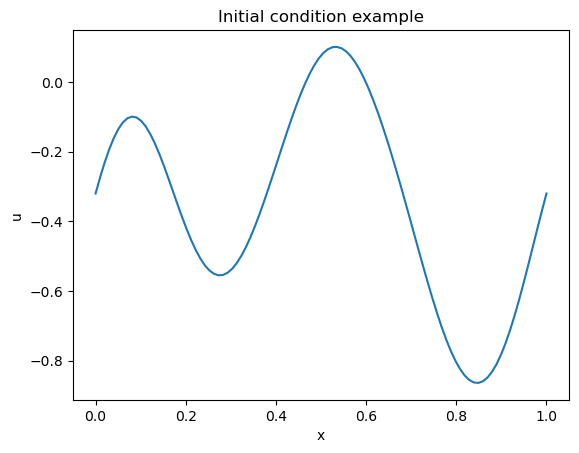

In [3]:
data_path='./data'
try:
    u0s.shape
except:
    u0s=[]
    u_solss=[]
    sol_refs=[]
    file_number=len(glob.glob(f'{data_path}/*.npz'))
    for i in tqdm(range(file_number)):
        try:
            data=np.load(f'{data_path}/{i}.npz')
            u0s.append(data['u0'])
            u_solss.append(data['u_sols'])
            sol_refs.append(data['sol_ref'])
        except:
            pass
    u0s=np.stack(u0s)
    u_solss=np.stack(u_solss)
    sol_refs=np.stack(sol_refs)
plt.figure()
plt.plot(np.linspace(0,1,u0s.shape[1]),u0s[0])
plt.title('Initial condition example')
plt.xlabel('x')
plt.ylabel('u')
plt.show()

# Replace nans with high random numbers

In [5]:
np.logical_not(np.isfinite(u_solss)).sum()

0

In [6]:
to_replace=np.logical_not(np.isfinite(u_solss))
#add all indexes where abs(u_solss)>100
to_replace=np.logical_or(to_replace,np.abs(u_solss)>100)

In [7]:
u_solss[to_replace]=10#*np.random.normal(0,1,u_solss[to_replace].shape)

In [8]:
all_diverged = np.any(to_replace,axis=(2,3))
all_diverged=np.all(all_diverged,axis=1)
all_diverged

array([False, False,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False,  True, False, False,  True, False, False, False, False,
       False,  True,  True, False, False, False,  True, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False,  True,  True, False,  True,  True, False, False,
       False, False,  True, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False,  True,  True,
        True, False, False, False, False,  True, False,  True, False,
       False, False, False, False,  True,  True, False, False, False,
       False, False,

In [9]:
u_solss=u_solss[np.logical_not(all_diverged)]
sol_refs=sol_refs[np.logical_not(all_diverged)]

In [10]:
u_solss.shape

(775, 7, 200, 100)

In [11]:
names=['Explicit','FVM','Implicit','Lax-Wendroff','Spectral','TVD','Riemann']

# Make a Fourier Neural Operator

In [12]:


class FourierLayer(nn.Module):
    def __init__(self, in_features, out_features,frequency_number):
        super(FourierLayer, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.frequency_number=frequency_number
        scale = (1 / (in_features * out_features))

        self.weight = nn.Parameter(scale * torch.rand(2*frequency_number,frequency_number,in_features,out_features, dtype=torch.cfloat))
        self.important_indexes=torch.cat([torch.arange(0,frequency_number),torch.arange(-frequency_number,0)])
        torch.nn.init.xavier_uniform_(self.weight)
    
    def __repr__(self):
        return self.__class__.__name__ + f' (in_features={self.in_features}, out_features={self.out_features},frequencies=({self.frequency_number},{self.frequency_number}))'
    
    def forward(self, x):
        fourier_transform = torch.fft.rfft2(x, dim=(1, 2))
        new_components = torch.zeros((*fourier_transform.shape[:-1],self.out_features),dtype=torch.cfloat,device=fourier_transform.device)
        new_components[:,self.important_indexes,:self.frequency_number,:] = torch.einsum('xyij,bxyi->bxyj', self.weight, fourier_transform[:,self.important_indexes,:self.frequency_number,:])
        return torch.fft.irfft2(new_components, s=x.shape[1:3],dim=(1, 2))


class FNO(nn.Module):
    def __init__(self, in_features, out_features,hidden_dim,frequency_number):
        super(FNO, self).__init__()
        self.linear0 = nn.Linear(in_features, hidden_dim)
        self.linear1 = nn.Linear(hidden_dim, hidden_dim)
        self.fourier1 = FourierLayer(hidden_dim, hidden_dim,frequency_number)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.fourier2 = FourierLayer(hidden_dim, hidden_dim,frequency_number)
        self.linear3 = nn.Linear(hidden_dim, hidden_dim)
        self.fourier3 = FourierLayer(hidden_dim, hidden_dim,frequency_number)
        self.linearfinal = FourierLayer(hidden_dim, out_features,frequency_number)
        self.relu = nn.ReLU()


    def forward(self, x,logits=False):
        x=self.linear0(x)
        x = self.linear1(x)+self.fourier1(x)
        x = self.relu(x)
        x = self.linear2(x)+self.fourier2(x)
        x = self.relu(x)
        x = self.linear3(x)+self.fourier3(x)
        x = self.relu(x)
        x = self.linearfinal(x)
        if logits:
            return x
        return torch.softmax(x,dim=-1)
fno=FNO(
    in_features = u_solss.shape[1],
    out_features=u_solss.shape[1],
    hidden_dim=64,
    frequency_number=12
    )
fno

FNO(
  (linear0): Linear(in_features=7, out_features=64, bias=True)
  (linear1): Linear(in_features=64, out_features=64, bias=True)
  (fourier1): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linear2): Linear(in_features=64, out_features=64, bias=True)
  (fourier2): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linear3): Linear(in_features=64, out_features=64, bias=True)
  (fourier3): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linearfinal): FourierLayer (in_features=64, out_features=7,frequencies=(12,12))
  (relu): ReLU()
)

# Train the FNO

In [13]:
def criterion_error(alphas,errors):
    return torch.mean(alphas**2*errors)
def criterion_log_error(alpha_logit,errors):
    return torch.mean((alpha_logit+torch.log(errors+1e-13))**2)

#define the device for CUDA or MAC-OS
if torch.cuda.is_available():
    device = torch.device("cuda")
#elif torch.backends.mps.is_available():
#    device = torch.device("mps")
else:
    device = torch.device("cpu")

def train_epoch(model, train_loader, optimizer):
    model.train()
    running_loss = 0.0
    pbar=tqdm(train_loader, desc="training")
    i=1
    for data in pbar:
        X,Y = data
        X=X.to(device)
        Y=Y.to(device)
        #inputs=torch.cat([X[:,None,:,:],model_values],dim=1).permute(0,2,3,1)
        #inputs = X[:,None,:,:].permute(0,2,3,1)
        #inputs=model_values.permute(0,2,3,1)
        errors=(Y[:,None,:,:]-X)**2
        optimizer.zero_grad()
        outputs = model(X.permute(0,2,3,1),logits=True).permute(0,3,1,2)
        preds = torch.sum(outputs*X,dim=1)
        #loss = criterion_error(outputs, errors)
        #loss = criterionMSE(Y,preds)
        loss = criterion_log_error(outputs, errors)
        loss.backward()
        optimizer.step()
        running_loss += loss.detach().cpu().item()
        pbar.set_postfix({'loss':running_loss/i})
        i+=1
    return running_loss / len(train_loader)

def get_pred(model,data_loader):
    model.eval()
    alphas_all=[]
    preds_all=[]
    with torch.no_grad():
        for i, data in enumerate(data_loader, 1):
            X,Y = data
            X=X.to(device)
            Y=Y.to(device)
            outputs = model(X.permute(0,2,3,1),logits=False).permute(0,3,1,2)
            preds = torch.sum(outputs*X,dim=1)
            alphas_all.append(outputs)
            preds_all.append(preds)
    return torch.cat(alphas_all,dim=0),torch.cat(preds_all,dim=0)


training: 100%|██████████| 20/20 [00:02<00:00,  9.22it/s, loss=4.78]


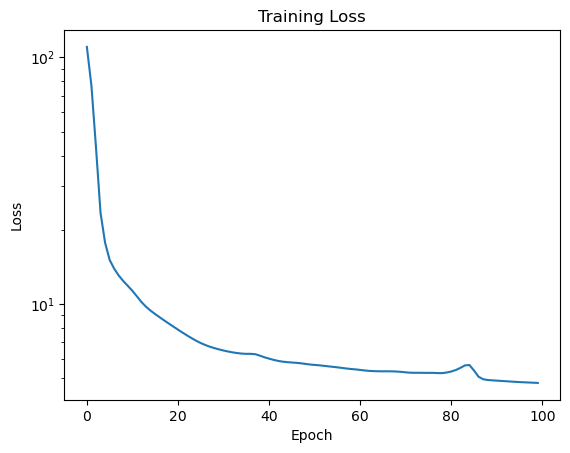

FNO(
  (linear0): Linear(in_features=7, out_features=64, bias=True)
  (linear1): Linear(in_features=64, out_features=64, bias=True)
  (fourier1): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linear2): Linear(in_features=64, out_features=64, bias=True)
  (fourier2): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linear3): Linear(in_features=64, out_features=64, bias=True)
  (fourier3): FourierLayer (in_features=64, out_features=64,frequencies=(12,12))
  (linearfinal): FourierLayer (in_features=64, out_features=7,frequencies=(12,12))
  (relu): ReLU()
)

In [14]:


X_train, X_test, Y_train, Y_test = train_test_split(u_solss, sol_refs, test_size=0.2, random_state=2)
X_train=torch.tensor(X_train,dtype=torch.float32)
Y_train=torch.tensor(Y_train,dtype=torch.float32)

X_test=torch.tensor(X_test,dtype=torch.float32)
Y_test=torch.tensor(Y_test,dtype=torch.float32)

train_dataset = TensorDataset(X_train, Y_train)
train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=False)

test_dataset = TensorDataset(X_test, Y_test)
test_loader = DataLoader(dataset=test_dataset, batch_size=32, shuffle=False)

optimizer = optim.Adam(fno.parameters(), lr=0.001)
criterionMSE = nn.MSELoss()




n_epochs = 100
train_losses = []
fno.to(device)
for epoch in range(n_epochs):
    train_loss = train_epoch(fno, train_loader, optimizer)
    train_losses.append(train_loss)

plt.plot(train_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.yscale('log')
plt.show()

fno.eval()


# View predition on train set

In [16]:
alpha_train,pred_train=get_pred(fno,train_loader)
alpha_train=alpha_train.cpu().numpy()
pred_train=pred_train.cpu().numpy()
X_train=X_train.numpy()
Y_train=Y_train.numpy()

In [17]:
np.mean(np.abs(pred_train-Y_train))

0.021969993

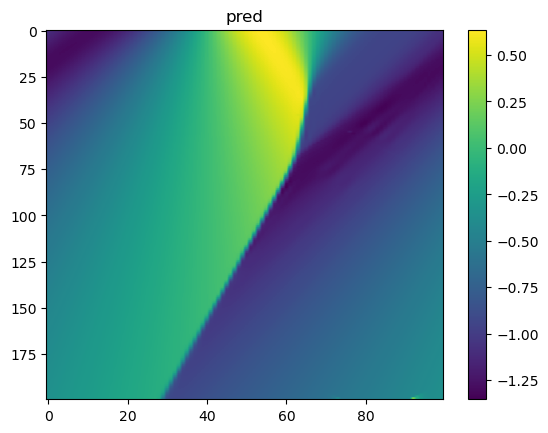

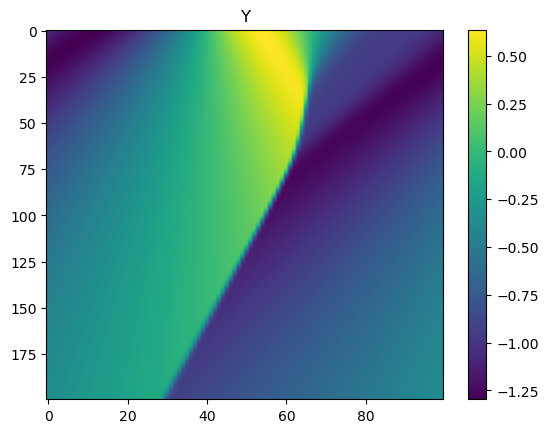

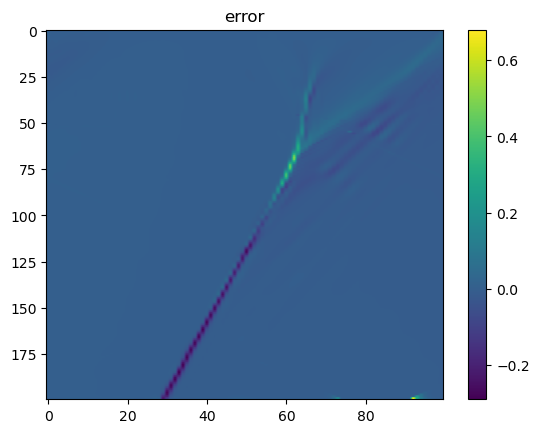

In [19]:
index=4
timestep=index
plt.imshow(pred_train[index],aspect='auto')
plt.title('pred')
plt.colorbar()
plt.figure()
plt.imshow(Y_train[index],aspect='auto')
plt.title('Y')
plt.colorbar()
plt.figure()
plt.imshow(pred_train[index]-Y_train[index],aspect='auto')
plt.title('error')
plt.colorbar()


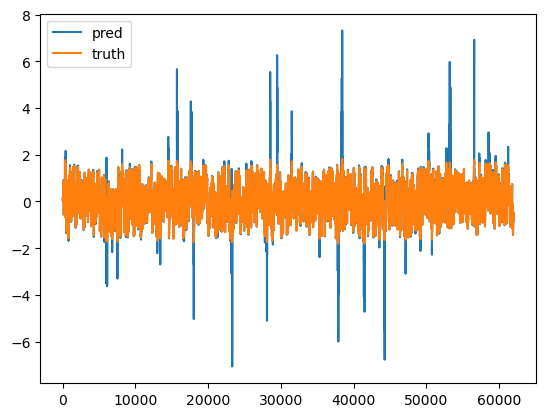

In [21]:
i=np.random.randint(0,pred_train.shape[1])
plt.plot(pred_train[:,i].flatten(),label='pred')
plt.plot(Y_train[:,i].flatten(),label='truth')
plt.legend()

# Evaluate on test set

In [22]:
alpha,pred=get_pred(fno,test_loader)
alpha=alpha.cpu().numpy()
pred=pred.cpu().numpy()
X_test=X_test.numpy()
Y_test=Y_test.numpy()

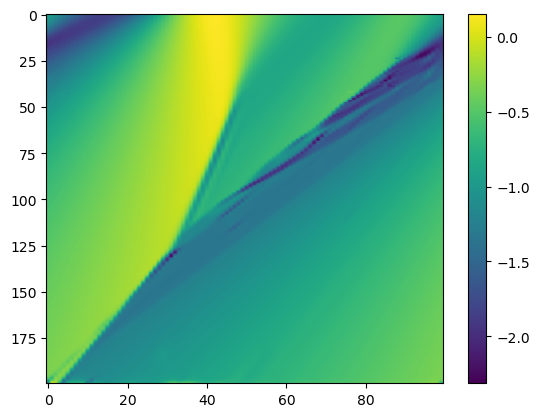

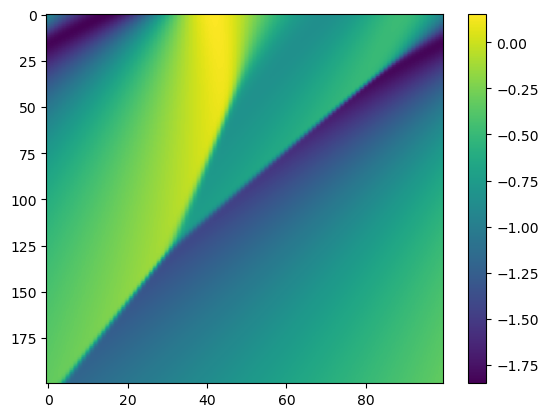

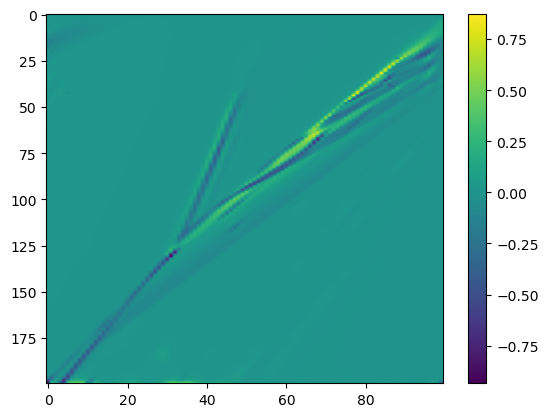

In [24]:
index=1
timestep=index
plt.imshow(pred[index],aspect='auto')
plt.colorbar()
plt.figure()
plt.imshow(Y_test[index],aspect='auto')
plt.colorbar()
plt.figure()
plt.imshow(pred[index]-Y_test[index],aspect='auto')
plt.colorbar()

In [25]:
errors_models= np.mean((X_test-Y_test[:,None,:,:])**2,axis=(-1,-2))
errors=np.mean((pred-Y_test)**2,axis=(1,2))
errors_test=np.concatenate([errors[:,None],errors_models],axis=1)

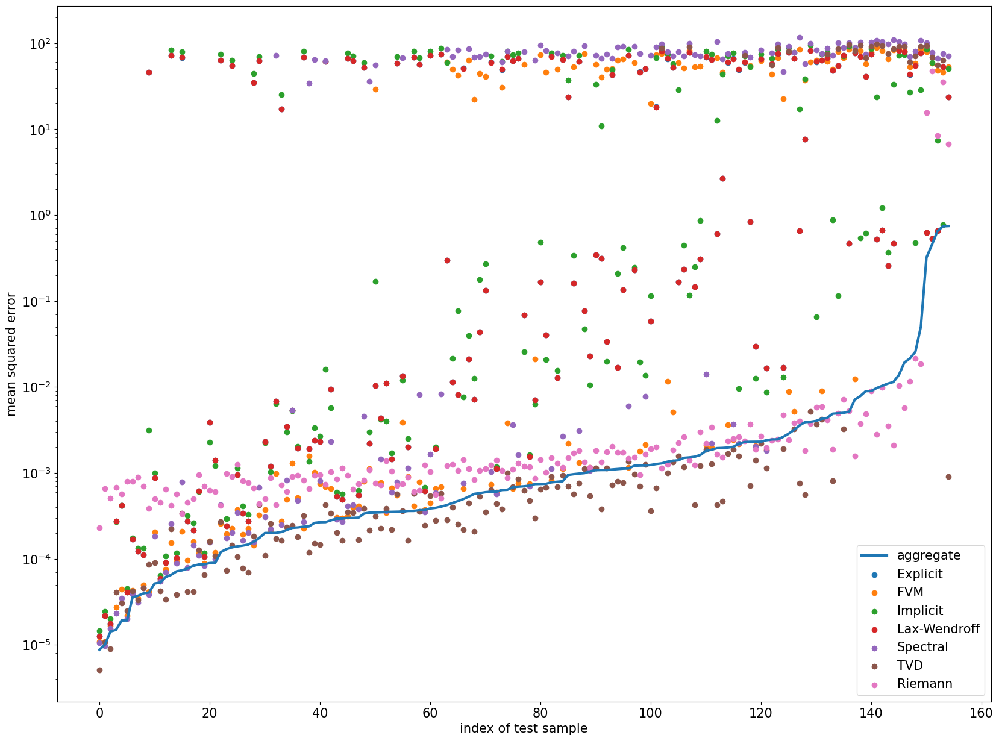

In [29]:
plt.figure(figsize=(20,15))
fsize=15
index=np.argsort(errors_test[:,0])
for model,error in zip(['aggregate']+names,errors_test.T):
    if model=='aggregate':
        plt.plot(error[index],label=model,zorder=10,linewidth=3)
    else:
        plt.scatter(np.arange(error.shape[0]),error[index],label=model)#,linewidth=2)
plt.xlabel('index of test sample',fontsize=fsize)
plt.ylabel('mean squared error',fontsize=fsize)
plt.xticks(fontsize=fsize)
plt.yticks(fontsize=fsize)
plt.yscale('log')
plt.legend(fontsize=fsize)

## count percentage of times the error is above 10, i.e. when the model output NaN

NaNs have been replaced with 10 for numerical stability, which gives an order of magnitude to the MSE of 100. Thus values above 10 indicate including NaN. 

In [30]:

count={name:val for name,val in zip(['aggregate']+names,np.sum(errors_test>1,axis=0)/errors_test.shape[0]*100)}
count

{'aggregate': 0.0,
 'Explicit': 43.87096774193549,
 'FVM': 41.29032258064516,
 'Implicit': 43.87096774193549,
 'Lax-Wendroff': 43.87096774193549,
 'Spectral': 52.25806451612903,
 'TVD': 16.7741935483871,
 'Riemann': 3.225806451612903}

In [ ]:
np.sum(errors_test[:,0]<np.min(errors_test[:,1:],axis=1))/errors_test.shape[0]*100

21.29032258064516

## Geometric average of the errors

This is the average order of magnitude of the MSE

In [31]:
{name:val for name,val in zip(['aggregate']+names,np.log10(errors_test).mean(axis=0))}

{'aggregate': -3.1062572,
 'Explicit': -0.45466456,
 'FVM': -1.2276461,
 'Implicit': -0.4883984,
 'Lax-Wendroff': -0.45460504,
 'Spectral': -0.6245117,
 'TVD': -2.5676618,
 'Riemann': -2.734493}

# Visualize a few examples

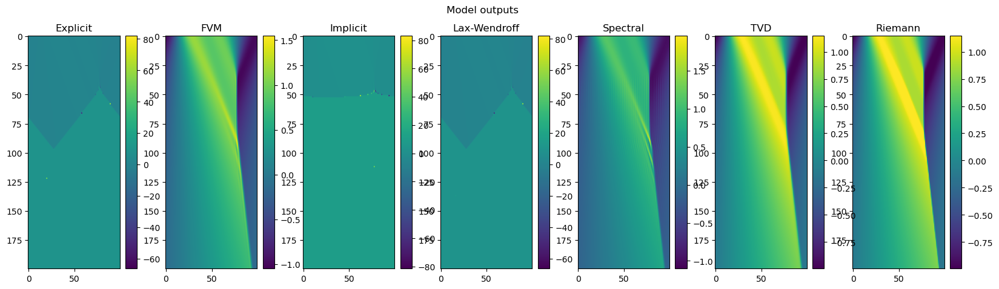

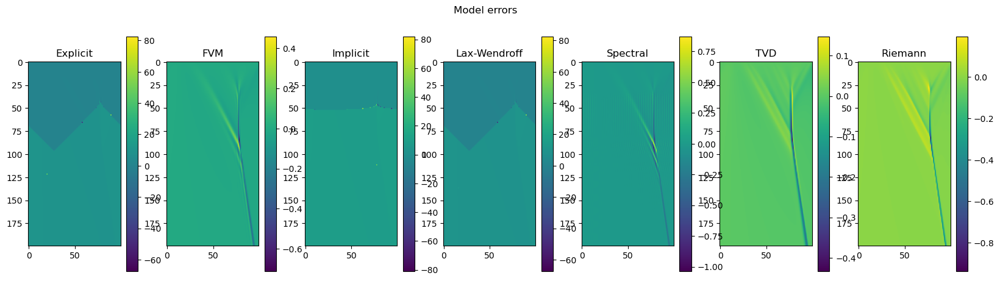

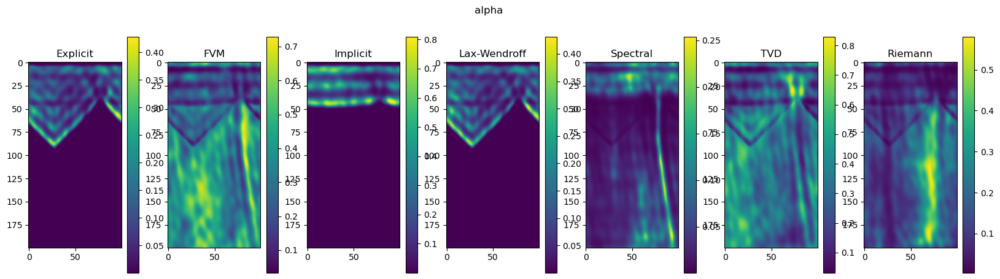

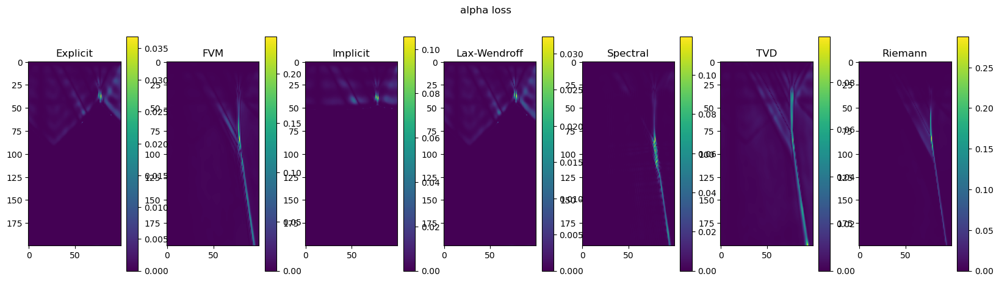

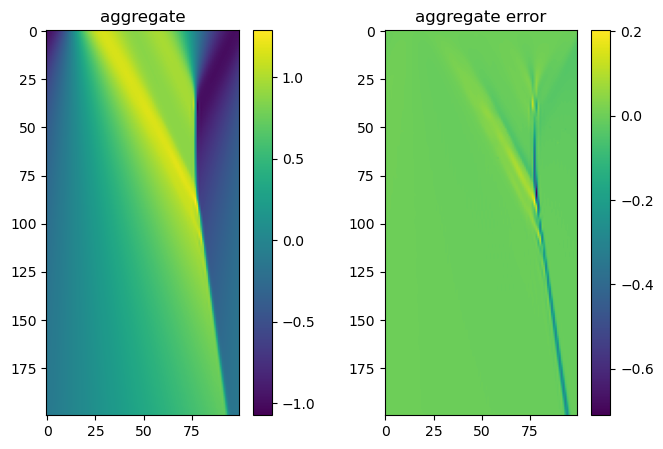

----------


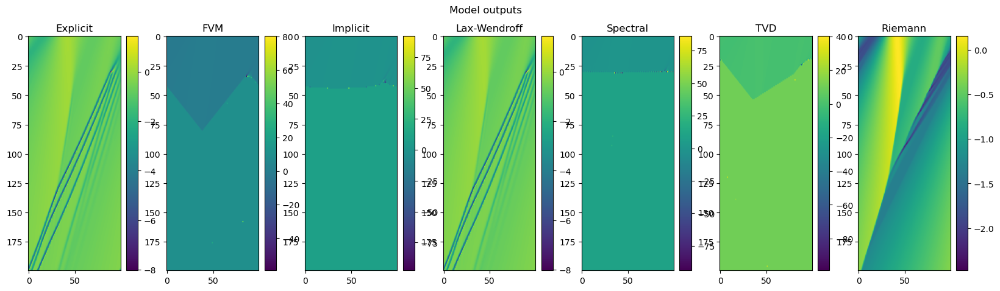

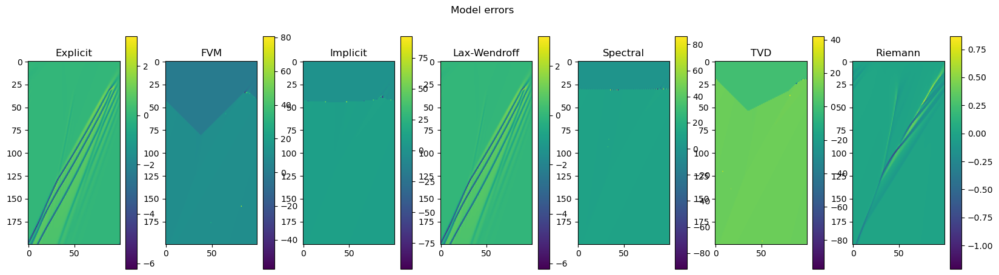

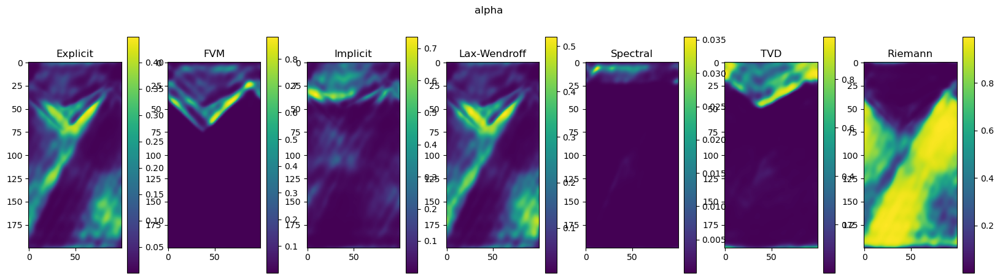

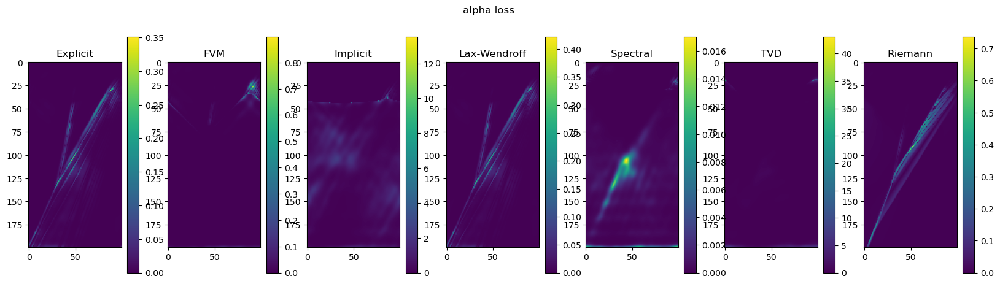

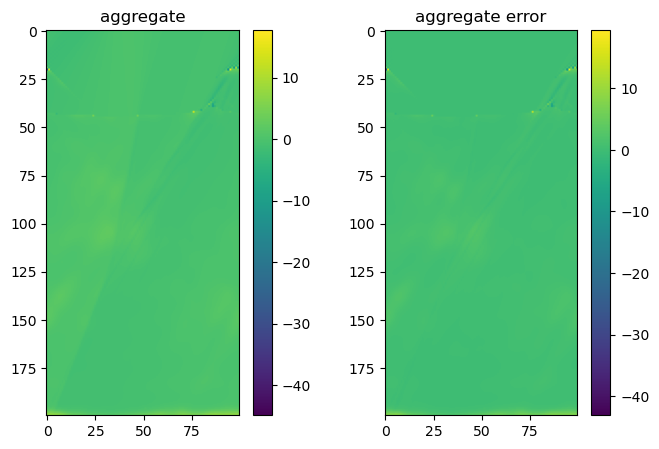

----------


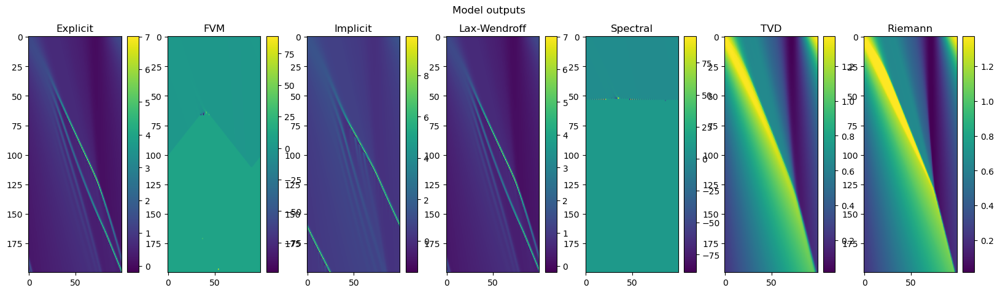

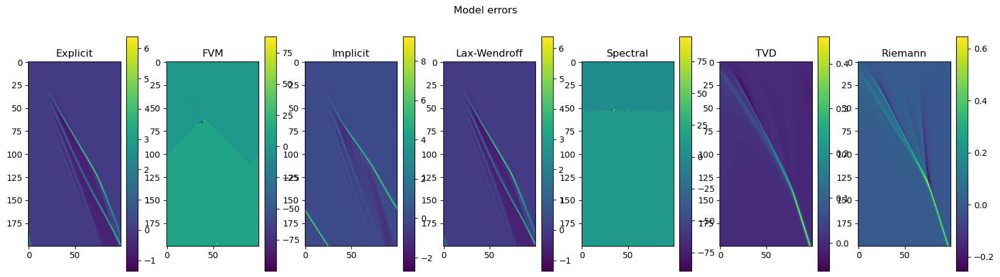

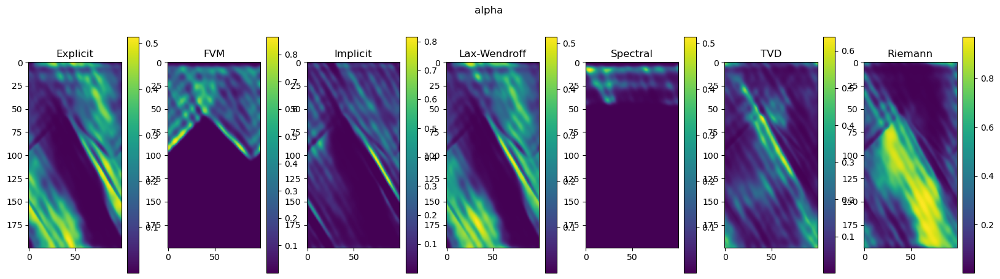

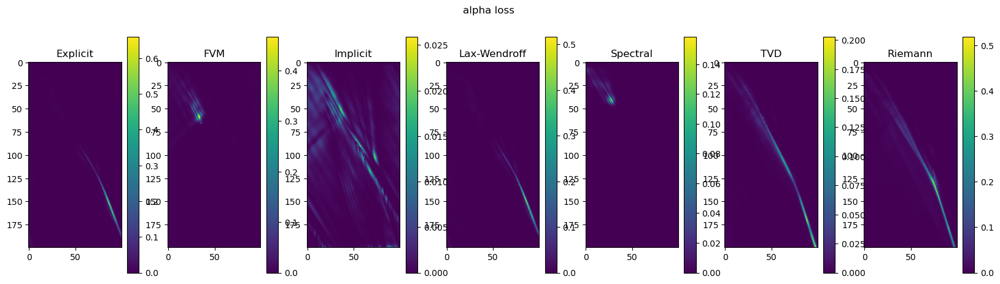

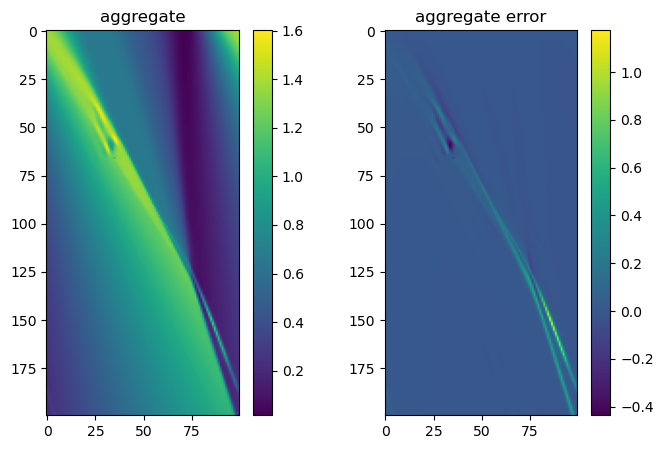

----------


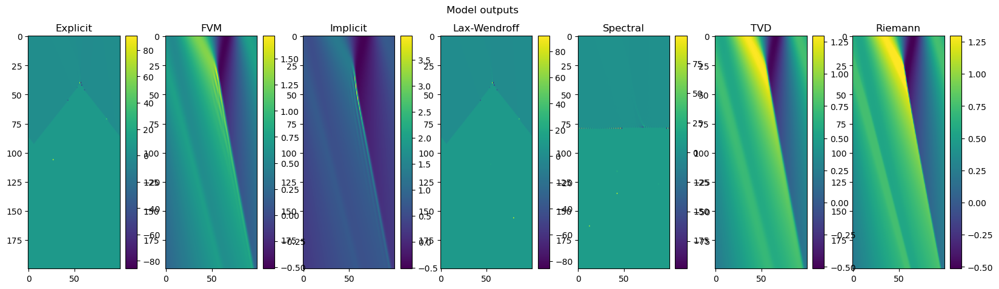

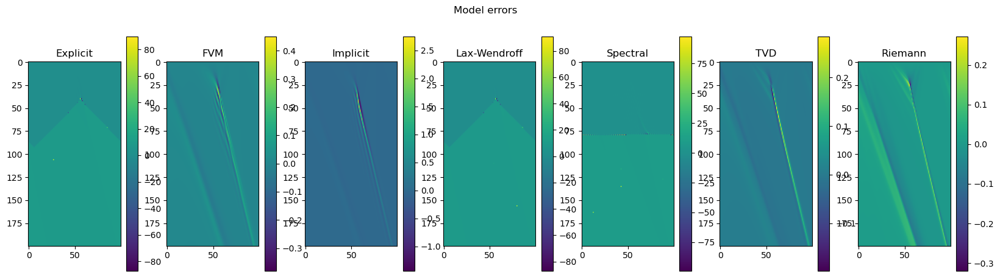

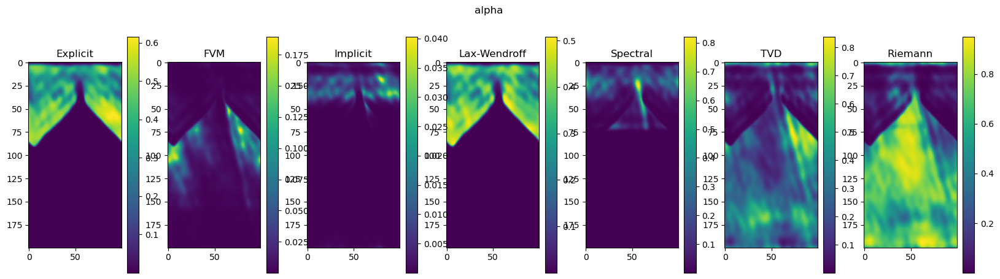

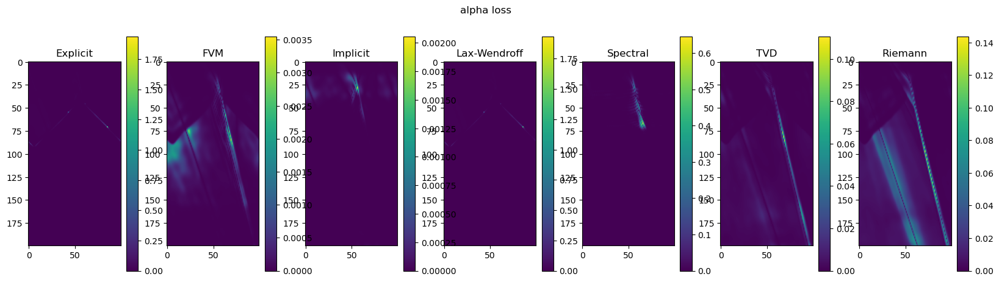

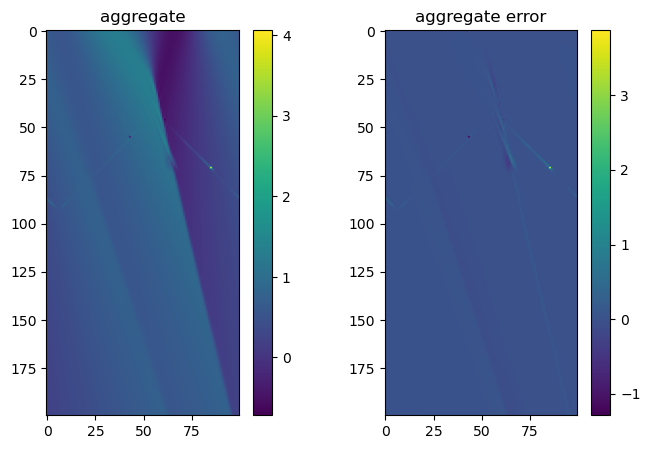

----------


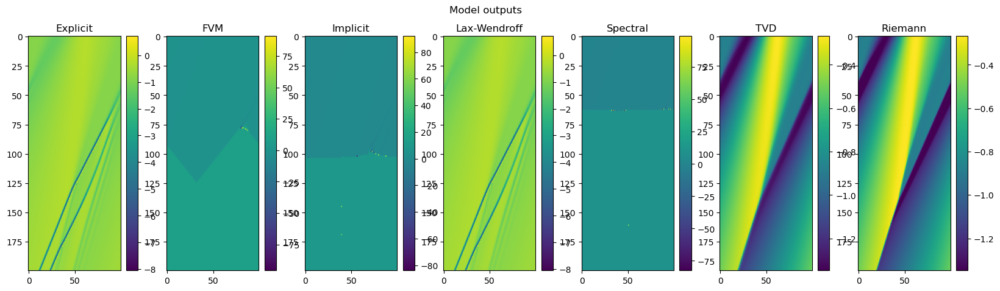

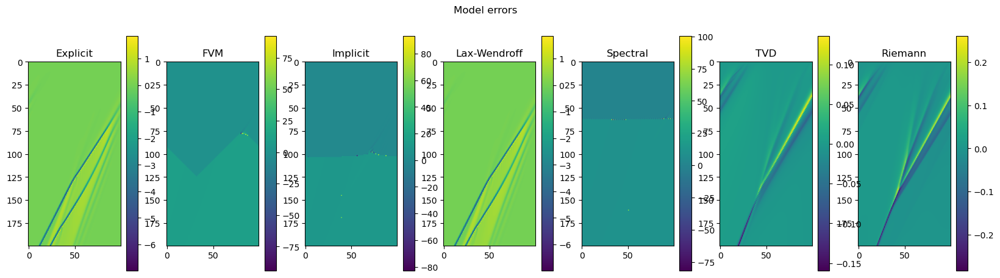

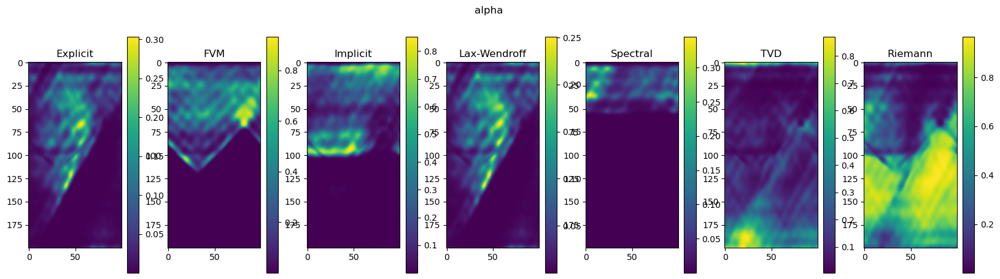

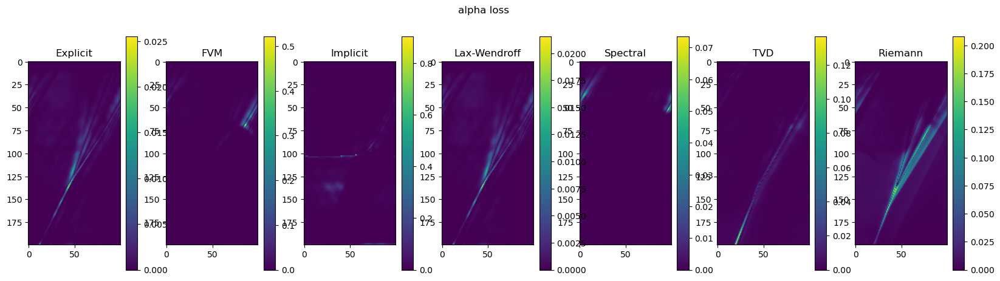

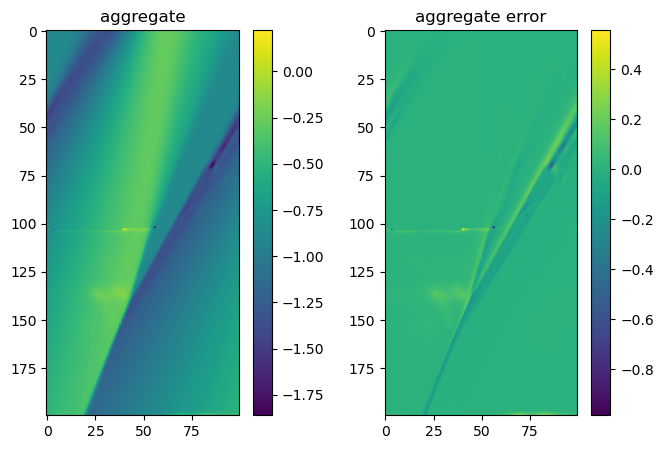

----------


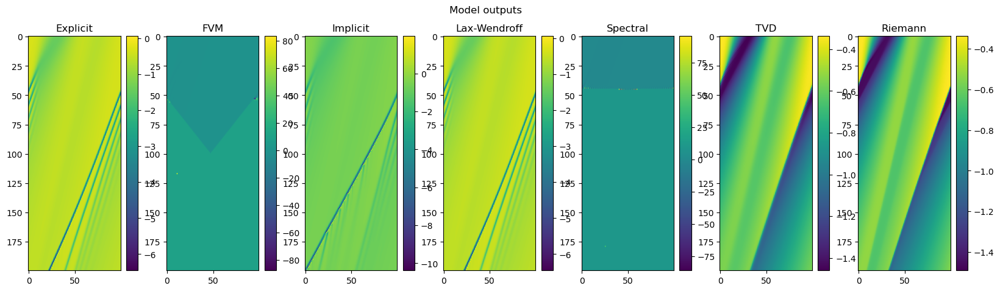

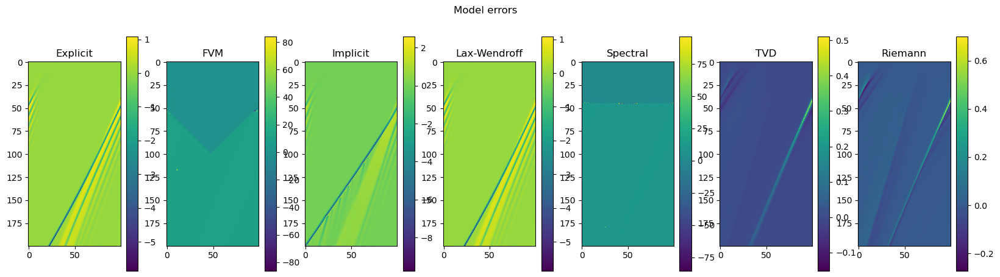

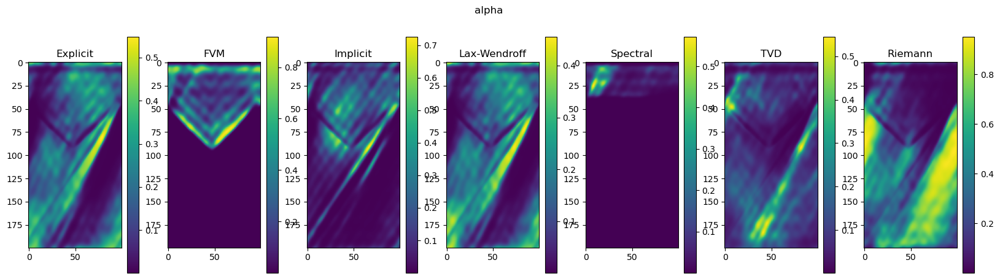

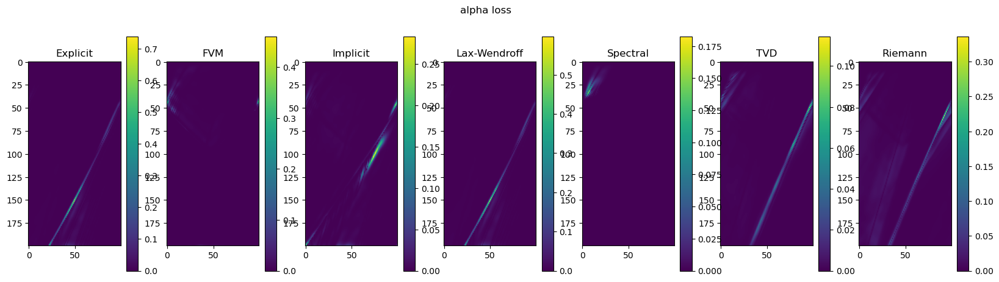

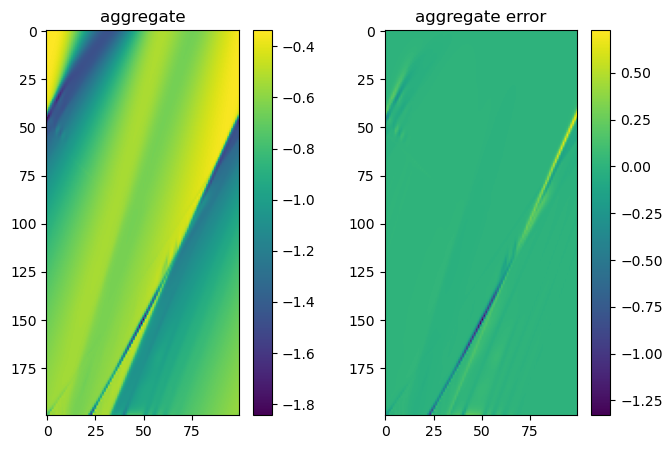

----------


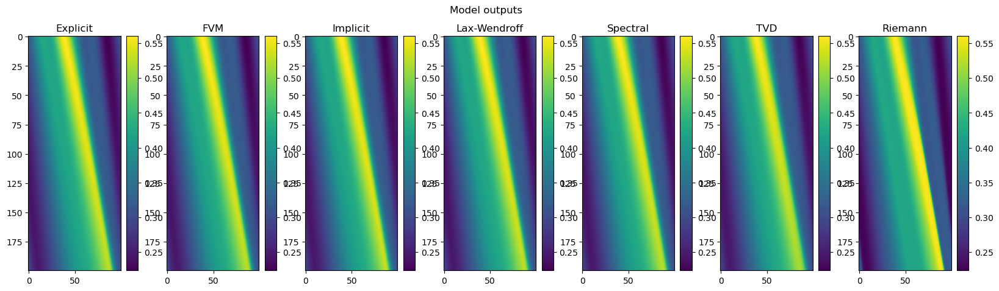

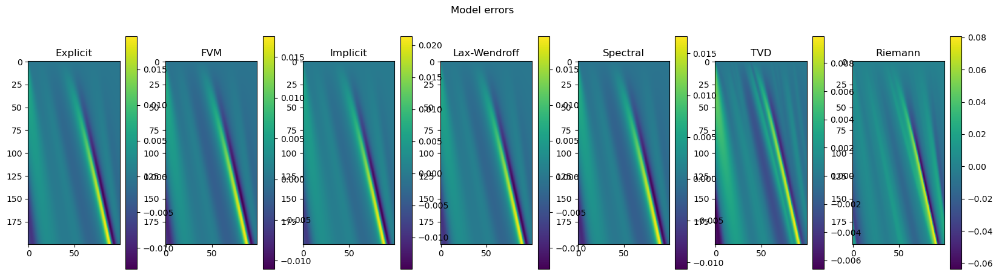

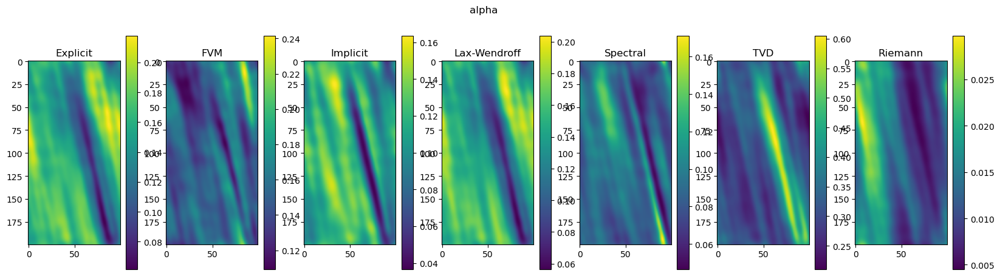

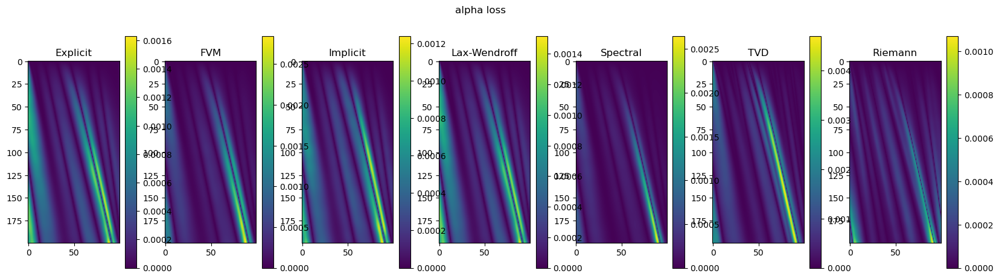

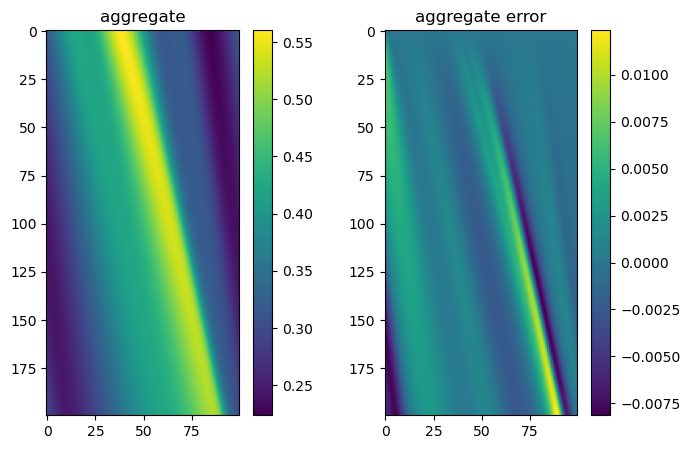

----------


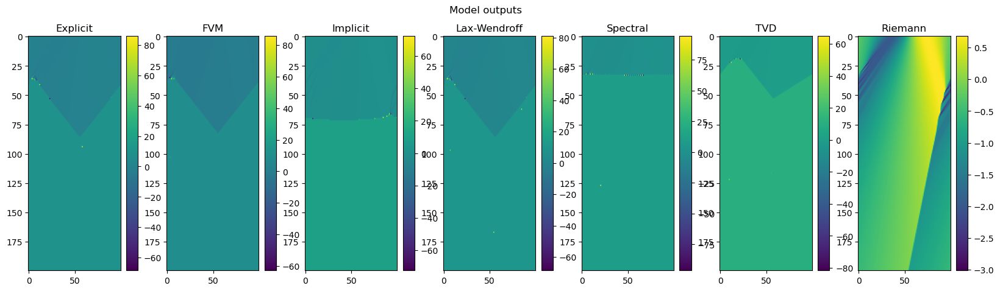

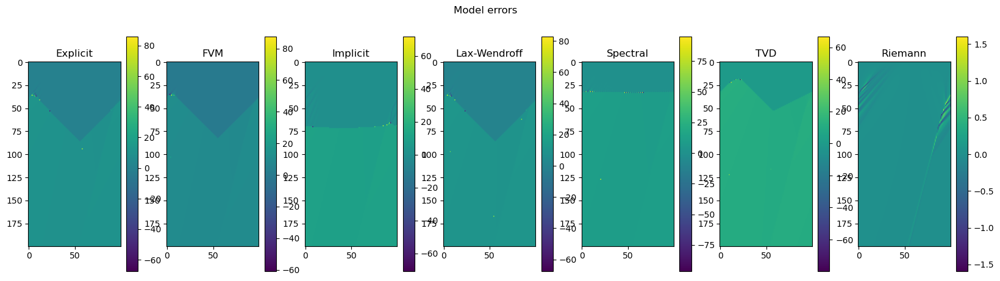

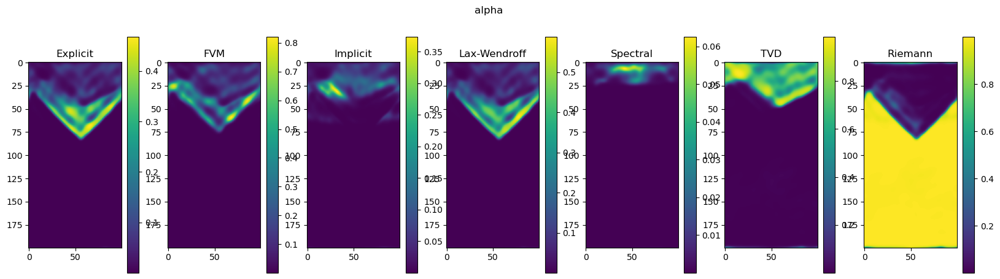

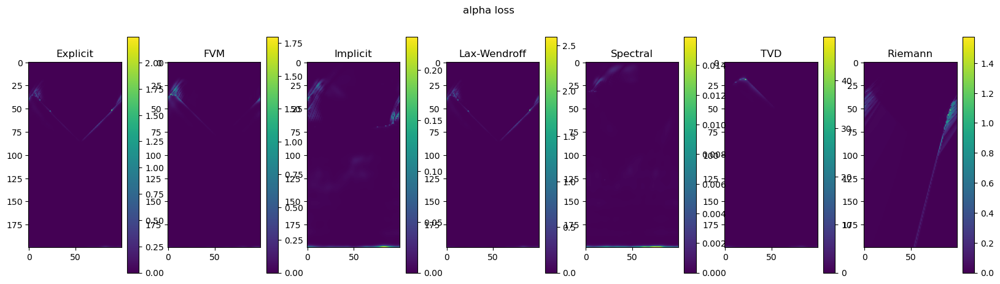

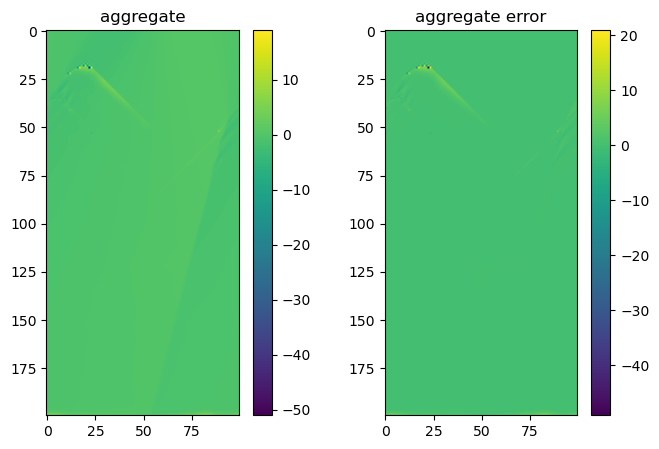

----------


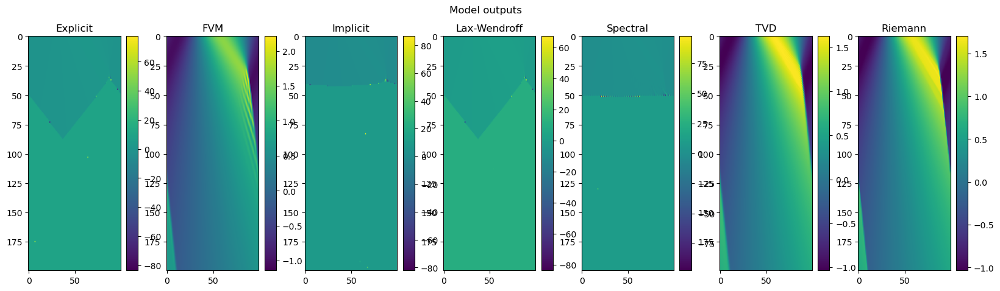

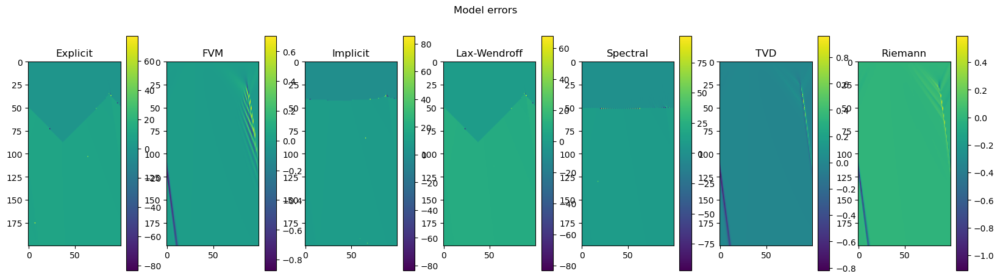

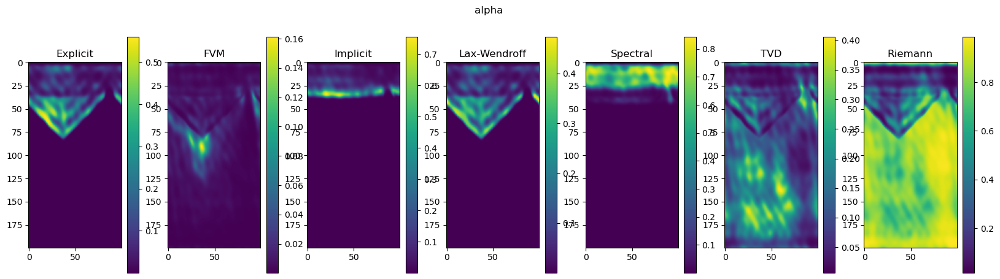

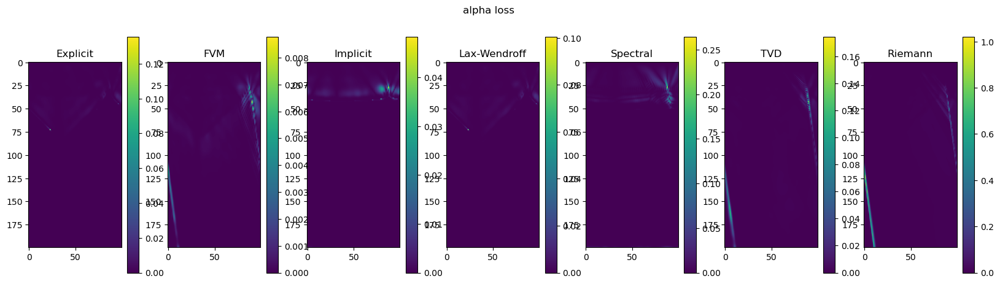

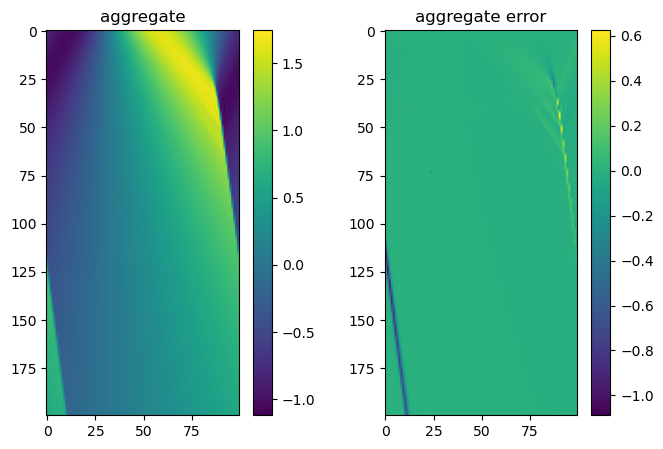

----------


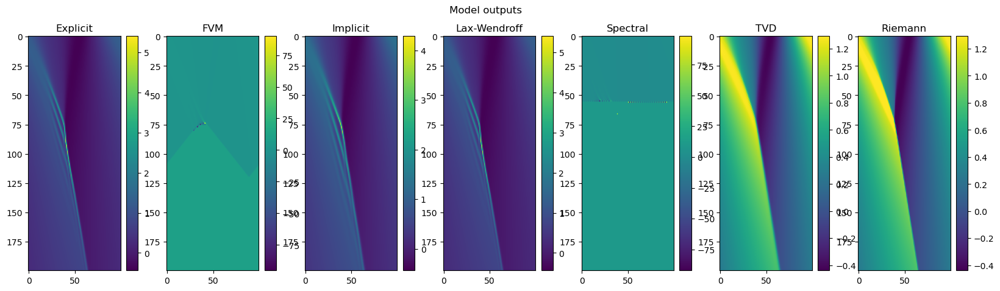

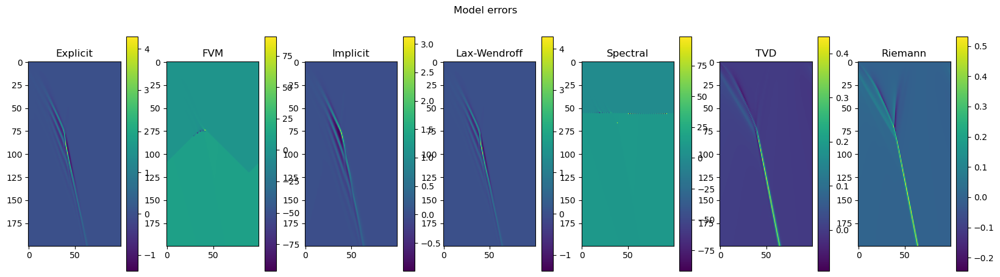

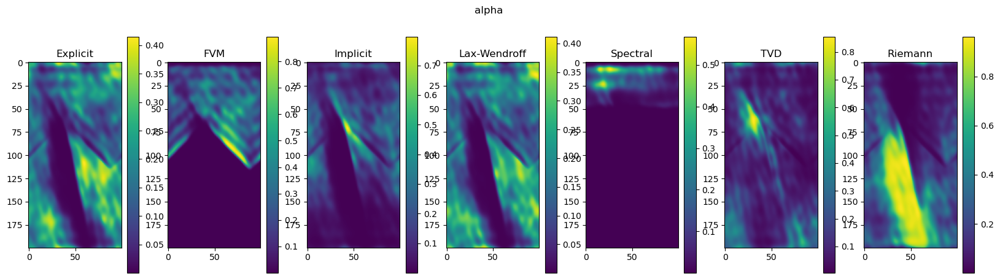

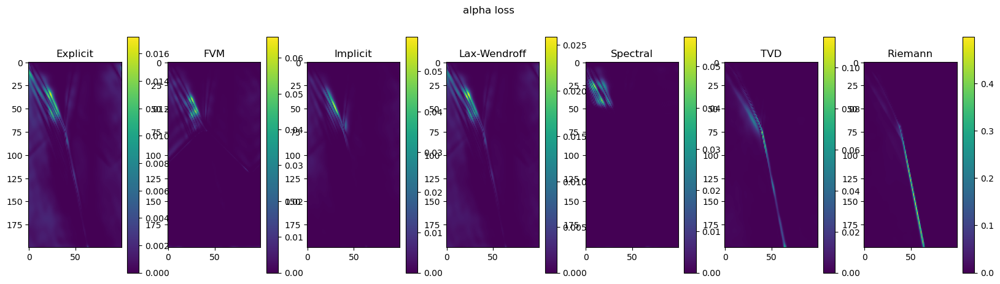

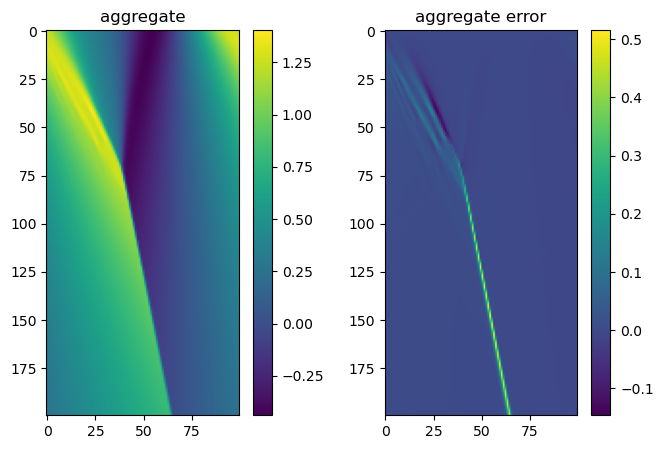

----------


In [ ]:
model_number=u_solss.shape[1]
for index in range(10):
    #make 5 subplots side by side
    fig, axs = plt.subplots(1, model_number, figsize=(20, 5))
    for i in range(model_number):
        data=X_test[index,i]
        axs[i].imshow(data,aspect='auto')
        axs[i].set_title(names[i])
        #colorbar
        fig.colorbar(axs[i].imshow(data,aspect='auto'), ax=axs[i])
        
    #suptitle
    fig.suptitle('Model outputs')
    fig, ax = plt.subplots(1, model_number, figsize=(20, 5))
    for i in range(model_number):
        data=X_test[index,i]-Y_test[index]
        ax[i].imshow(data,aspect='auto')
        ax[i].set_title(names[i])
        #colorbar
        fig.colorbar(ax[i].imshow(data), ax=ax[i])
    #suptitle
    fig.suptitle('Model errors')
    
    fig, ax = plt.subplots(1, model_number, figsize=(20, 5))
    for i in range(model_number):
        data=alpha[index,i]
        ax[i].imshow(data)
        ax[i].set_title(names[i])
        #colorbar
        fig.colorbar(ax[i].imshow(data), ax=ax[i])
        #set c_lim to (0,1)
    #suptitle
    fig.suptitle('alpha')
    fig, ax = plt.subplots(1, model_number, figsize=(20, 5))
    for i in range(model_number):
        data=alpha[index,i]*np.abs(X_test[index,i]-Y_test[index])
        ax[i].imshow(data)
        ax[i].set_title(names[i])
        #colorbar
        fig.colorbar(ax[i].imshow(data), ax=ax[i])
    #suptitle
    fig.suptitle('alpha loss')
    
    fig, ax = plt.subplots(1, 2, figsize=(8, 5))
    ax[0].imshow(pred[index])
    ax[0].set_title('aggregate')
    #colorbar
    fig.colorbar(ax[0].imshow(pred[index]), ax=ax[0])
    ax[1].imshow(pred[index]-Y_test[index])
    ax[1].set_title('aggregate error')
    #colorbar
    fig.colorbar(ax[1].imshow(pred[index]-Y_test[index]), ax=ax[1])
    
    plt.show()
    print('-'*10)